In [1]:
import pandas as pd
import numpy as np

In [2]:
weather = pd.read_csv('weather.csv', index_col='DATE')

In [3]:
weather.head()

,STATION,NAME,ACMH,ACSH,AWND,FMTM,PGTM,PRCP,SNOW,SNWD,...,WT14,WT15,WT16,WT17,WT18,WT19,WT21,WT22,WV01,WV20
DATE,,,,,,,,,,,,,,,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",80.0,90.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",20.0,20.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",90.0,100.0,NaN,NaN,NaN,0.05,0.4,0.0,...,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",20.0,20.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",30.0,10.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Data Cleaning for nulls

In [4]:
# Get the % of null values in each column
null_pct = weather.apply(pd.isnull).sum()/weather.shape[0]

In [5]:
null_pct

STATION    0.000000
NAME       0.000000
ACMH       0.502175
ACSH       0.502149
AWND       0.264834
FMTM       0.475769
PGTM       0.349643
PRCP       0.000000
SNOW       0.000000
SNWD       0.000026
TAVG       0.679455
TMAX       0.000000
TMIN       0.000000
TSUN       0.997774
WDF1       0.599177
WDF2       0.497929
WDF5       0.500337
WDFG       0.659910
WDFM       0.903101
WESD       0.683882
WSF1       0.599073
WSF2       0.497929
WSF5       0.500362
WSFG       0.599151
WSFM       0.903101
WT01       0.656208
WT02       0.952211
WT03       0.931811
WT04       0.982267
WT05       0.981257
WT06       0.990525
WT07       0.994641
WT08       0.776043
WT09       0.994305
WT11       0.999146
WT13       0.893290
WT14       0.955576
WT15       0.997825
WT16       0.664104
WT17       0.996971
WT18       0.937610
WT19       0.999741
WT21       0.999819
WT22       0.997437
WV01       0.999974
WV20       0.999974
dtype: float64

In [6]:
# We only want to take those columns where % of null values is below 5%
valid_columns = weather.columns[null_pct < 0.05]
valid_columns

Index(['STATION', 'NAME', 'PRCP', 'SNOW', 'SNWD', 'TMAX', 'TMIN'], dtype='object')

In [7]:
# Subset main data to only these valid columns
weather = weather[valid_columns].copy()
weather

,STATION,NAME,PRCP,SNOW,SNWD,TMAX,TMIN
DATE,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33


In [8]:
# Convert columns to lowercase
weather.columns = weather.columns.str.lower()
weather

,station,name,prcp,snow,snwd,tmax,tmin
DATE,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33


In [9]:
# Convert date index to datetime format
weather.index = pd.to_datetime(weather.index)

### Split data

In [10]:
weather['station'].unique()

array(['USW00014732', 'USW00094789'], dtype=object)

In [11]:
lga = weather[weather["station"] == "USW00014732"].copy()
weather = weather[weather["station"] == "USW00094789"].copy()
weather = weather.merge(lga, left_index=True, right_index=True)
weather.head()

,station_x,name_x,prcp_x,snow_x,snwd_x,tmax_x,tmin_x,station_y,name_y,prcp_y,snow_y,snwd_y,tmax_y,tmin_y
DATE,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21


### Predict max temp at JFK

In [12]:
# Needed to be called 'y' by Prophet
weather["y"] = weather.shift(-1)["tmax_x"]
# Forward fill nulls
weather = weather.ffill()
# Needed by Prophet
weather["ds"] = weather.index
predictors = weather.columns[~weather.columns.isin(["y", "name_x", "station_x", "name_y", "station_y", "ds"])]
predictors

Index(['prcp_x', 'snow_x', 'snwd_x', 'tmax_x', 'tmin_x', 'prcp_y', 'snow_y',
       'snwd_y', 'tmax_y', 'tmin_y'],
      dtype='object')

In [13]:
train = weather[:"2021-12-31"]
test = weather["2021-12-31":]

In [14]:
# Fit initial prophet model
from prophet import Prophet

def fit_prophet(train):
    # Initialize Prophet class
    m = Prophet()
    for p in predictors:
        m.add_regressor(p)
    m.fit(train)
    return m

m = fit_prophet(train)

17:53:36 - cmdstanpy - INFO - Chain [1] start processing
17:53:38 - cmdstanpy - INFO - Chain [1] done processing


In [15]:
# Look at column yhat
predictions = m.predict(test)
predictions

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-12-31,61.479333,42.753669,58.300119,61.479333,61.479333,-10.172135,-10.172135,-10.172135,-2.408225,...,0.024371,0.024371,0.024371,-7.788281,-7.788281,-7.788281,0.0,0.0,0.0,51.307198
1,2022-01-01,61.479123,45.135830,59.897646,61.479123,61.479123,-9.477176,-9.477176,-9.477176,-1.629547,...,-0.016546,-0.016546,-0.016546,-7.831083,-7.831083,-7.831083,0.0,0.0,0.0,52.001947
2,2022-01-02,61.478913,41.876315,57.075836,61.478913,61.478913,-11.880998,-11.880998,-11.880998,-4.101376,...,0.092193,0.092193,0.092193,-7.871815,-7.871815,-7.871815,0.0,0.0,0.0,49.597915
3,2022-01-03,61.478703,31.260113,46.333055,61.478703,61.478703,-22.894394,-22.894394,-22.894394,-15.311822,...,0.327938,0.327938,0.327938,-7.910510,-7.910510,-7.910510,0.0,0.0,0.0,38.584309
4,2022-01-04,61.478493,28.234400,44.041949,61.478493,61.478493,-25.303647,-25.303647,-25.303647,-17.263756,...,-0.092702,-0.092702,-0.092702,-7.947190,-7.947190,-7.947190,0.0,0.0,0.0,36.174846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317,2022-11-13,61.412804,49.024598,64.013121,61.399867,61.433584,-5.037925,-5.037925,-5.037925,-2.145165,...,0.092193,0.092193,0.092193,-2.984952,-2.984952,-2.984952,0.0,0.0,0.0,56.374879
318,2022-11-14,61.412594,42.929439,57.606444,61.399565,61.433592,-11.145363,-11.145363,-11.145363,-8.350570,...,0.327938,0.327938,0.327938,-3.122731,-3.122731,-3.122731,0.0,0.0,0.0,50.267230
319,2022-11-15,61.412384,41.811934,56.692542,61.399263,61.433600,-12.084151,-12.084151,-12.084151,-8.731586,...,-0.092702,-0.092702,-0.092702,-3.259863,-3.259863,-3.259863,0.0,0.0,0.0,49.328233
320,2022-11-16,61.412174,42.709947,58.067598,61.398960,61.433608,-10.699225,-10.699225,-10.699225,-7.040884,...,-0.262075,-0.262075,-0.262075,-3.396266,-3.396266,-3.396266,0.0,0.0,0.0,50.712949


In [16]:
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric
plot_components_plotly(m, predictions)

In [17]:
# Each row gives impact of each regressor on our prediction
# prcp_x is negative which implies that we predict if it rained in jfk today, temp would be lower tomorrow
from prophet.utilities import regressor_coefficients
regressor_coefficients(m)

,regressor,regressor_mode,center,coef_lower,coef,coef_upper
0,prcp_x,additive,0.118130,-0.196277,-0.196277,-0.196277
1,snow_x,additive,0.064540,-0.011579,-0.011579,-0.011579
2,snwd_x,additive,0.209635,0.064109,0.064109,0.064109
3,tmax_x,additive,61.758648,0.013247,0.013247,0.013247
4,tmin_x,additive,47.494024,-0.082651,-0.082651,-0.082651
5,prcp_y,additive,0.123378,-0.322861,-0.322861,-0.322861
6,snow_y,additive,0.071347,-0.491521,-0.491521,-0.491521
7,snwd_y,additive,0.217759,-0.201873,-0.201873,-0.201873
8,tmax_y,additive,62.609277,0.280783,0.280783,0.280783
9,tmin_y,additive,48.923130,0.426018,0.426018,0.426018


In [18]:
predictions.index = test.index
predictions["actual"] = test["y"]

def mse(predictions, actual_label="actual", pred_label="yhat"):
    se = ((predictions[actual_label] - predictions[pred_label]) ** 2)
    print(se.mean())
    
mse(predictions)

40.48363585124421


### Try crossvalidation

In [19]:
from prophet.diagnostics import cross_validation, performance_metrics

m = fit_prophet(weather)
# initial means our first train set which we set to 5 years
# period is how much we want to retrain it on
# horizon means how far out are we predicting
cv = cross_validation(m, initial=f'{365 * 5} days', period='180 days', horizon = '180 days', parallel="processes")

mse(cv, actual_label="y")

18:04:53 - cmdstanpy - INFO - Chain [1] start processing
18:04:56 - cmdstanpy - INFO - Chain [1] done processing
18:05:01 - cmdstanpy - INFO - Chain [1] start processing
18:05:01 - cmdstanpy - INFO - Chain [1] start processing
18:05:01 - cmdstanpy - INFO - Chain [1] start processing
18:05:01 - cmdstanpy - INFO - Chain [1] start processing
18:05:01 - cmdstanpy - INFO - Chain [1] start processing
18:05:01 - cmdstanpy - INFO - Chain [1] start processing
18:05:01 - cmdstanpy - INFO - Chain [1] start processing
18:05:01 - cmdstanpy - INFO - Chain [1] start processing
18:05:02 - cmdstanpy - INFO - Chain [1] done processing
18:05:02 - cmdstanpy - INFO - Chain [1] done processing
18:05:02 - cmdstanpy - INFO - Chain [1] done processing
18:05:02 - cmdstanpy - INFO - Chain [1] done processing
18:05:02 - cmdstanpy - INFO - Chain [1] done processing
18:05:02 - cmdstanpy - INFO - Chain [1] done processing
18:05:02 - cmdstanpy - INFO - Chain [1] done processing
18:05:03 - cmdstanpy - INFO - Chain [1]

18:06:18 - cmdstanpy - INFO - Chain [1] start processing
18:06:18 - cmdstanpy - INFO - Chain [1] start processing
18:06:18 - cmdstanpy - INFO - Chain [1] done processing
18:06:18 - cmdstanpy - INFO - Chain [1] done processing
18:06:19 - cmdstanpy - INFO - Chain [1] start processing
18:06:23 - cmdstanpy - INFO - Chain [1] start processing
18:06:23 - cmdstanpy - INFO - Chain [1] start processing
18:06:23 - cmdstanpy - INFO - Chain [1] done processing
18:06:27 - cmdstanpy - INFO - Chain [1] start processing
18:06:32 - cmdstanpy - INFO - Chain [1] done processing
18:06:32 - cmdstanpy - INFO - Chain [1] done processing
18:06:35 - cmdstanpy - INFO - Chain [1] done processing
18:06:36 - cmdstanpy - INFO - Chain [1] start processing
18:06:36 - cmdstanpy - INFO - Chain [1] start processing
18:06:37 - cmdstanpy - INFO - Chain [1] done processing
18:06:39 - cmdstanpy - INFO - Chain [1] start processing
18:06:40 - cmdstanpy - INFO - Chain [1] done processing
18:06:41 - cmdstanpy - INFO - Chain [1]

36.18639712031142


<AxesSubplot:>

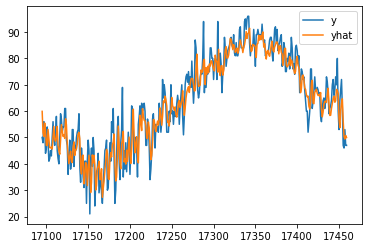

In [20]:
# Just looking at last 365 days
cv[["y", "yhat"]][-365:].plot()

In [21]:
# Predict 1 day into future - high accuracy
m = fit_prophet(weather)
m.predict(weather.iloc[-1:])

18:09:23 - cmdstanpy - INFO - Chain [1] start processing
18:09:27 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2022-11-17,61.666621,42.580161,57.785571,61.666621,61.666621,-11.531063,-11.531063,-11.531063,-7.904645,...,-0.065155,-0.065155,-0.065155,-3.561262,-3.561262,-3.561262,0.0,0.0,0.0,50.135558


In [22]:
# Predict multiple days ahead with lower accuracy
m = Prophet()
m.fit(weather)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

18:10:02 - cmdstanpy - INFO - Chain [1] start processing
18:10:03 - cmdstanpy - INFO - Chain [1] done processing


In [24]:
from prophet.plot import plot_plotly

plot_plotly(m, forecast)